# Intro
## General
Machine learning allows the user to feed a computer algorithm an immense amount of data and have the computer analyze and make data-driven recommendations and decisions based on only the input data. 
In most of the situations we want to have a machine learning system to make **predictions**, so we have several categories of machine learning tasks depending on the type of prediction needed: **Classification, Regression, Clustering, Generation**, etc.

**Classification** is the task whose goal is the prediction of the label of the class to which the input belongs (e.g., Classification of images in two classes: cats and dogs).
**Regression** is the task whose goal is the prediction of numerical value(s) related to the input (e.g., House rent prediction, Estimated time of arrival ).
**Generation** is the task whose goal is the creation of something new related to the input (e.g., Text translation, Audio beat generation, Image denoising ). **Clustering** is the task of grouping a set of objects in such a way that objects in the same group (called a **cluster**) are more similar (in some sense) to each other than to those in other **clusters** (e.g., Clients clutering).

In machine learning, there are learning paradigms that relate to one aspect of the dataset: **the presence of the label to be predicted**. **Supervised Learning** is the paradigm of learning that is applied when the dataset has the label variables to be predicted, known as ` y variables`. **Unsupervised Learning** is the paradigm of learning that is applied when the dataset has not the label variables to be predicted. **Self-supervised Learning** is the paradigm of learning that is applied when part of the X dataset is considere as the label to be predicted (e.g., the Dataset is made of texts and the model try to predict the next word of each sentence).


# Setup

## Installation
Here is the section to install all the packages/libraries that will be needed to tackle the challlenge.

In [1]:
# %pip install pyodbc
# %pip install python-dotenv 
# %pip install openpyxl
# %pip install imbalanced-learn
#%pip install gdown

## Importation
Here is the section to import all the packages/libraries that will be used through this notebook.

In [2]:
# Data handling
import pandas as pd
import pyodbc #just installed with pip
from dotenv import dotenv_values #import the dotenv_values function from the dotenv package
import pandas as pd
import warnings 
# import gdown
warnings.filterwarnings('ignore')
# Vizualisation (Matplotlib, Plotly, Seaborn, etc. )
import seaborn as sns
import matplotlib.pyplot as plt

# EDA (pandas-profiling, etc. )
...

# Feature Processing (Scikit-learn processing, etc. )
...

# Machine Learning (Scikit-learn Estimators, Catboost, LightGBM, etc. )
...

# Hyperparameters Fine-tuning (Scikit-learn hp search, cross-validation, etc. )
...

# Other packages
import os, pickle


# Data Loading
Here is the section to load the datasets (train, eval, test) and the additional files

In [3]:
# For CSV, use pandas.read_csv
# Load environment variables from .env file into a dictionary
environment_variables = dotenv_values('.env')


# Get the values for the credentials you set in the '.env' file
database = environment_variables.get("DATABASE")
server = environment_variables.get("SERVER")
username = environment_variables.get("USERNAME")
password = environment_variables.get("PASSWORD")


connection_string = f"DRIVER={{SQL Server}};SERVER={server};DATABASE={database};UID={username};PWD={password}"

In [4]:
# Use the connect method of the pyodbc library and pass in the connection string.
# This will connect to the server and might take a few seconds to be complete. 
# Check your internet connection if it takes more time than necessary

connection = pyodbc.connect(connection_string)


In [5]:
# Get the cursor
# The connection cursor is used to execute statements to communicate with the MySQL database
cursor = connection.cursor()

# Retrieve the table names
table_names = cursor.tables(tableType='TABLE')

# Fetch all the table names
tables = table_names.fetchall()

# Print the table names
for table in tables:
    print(table.table_name)

holidays_events
oil
stores
trace_xe_action_map
trace_xe_event_map


In [6]:
# sql query to get the dataset

query1 = "SELECT * FROM holidays_events"
data1=pd.read_sql(query1,connection)

In [6]:
#save holidays_event csv
data1.to_csv ("holidays_events.csv", 
                  index = None,
                  header=True)

In [7]:
data1.head()


,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False


In [8]:
query2 = "SELECT * FROM oil"

data2=pd.read_sql(query2,connection)

In [9]:
#save oil csv
data2.to_csv ("oil.csv", 
                  index = None,
                  header=True)

In [9]:
data2.head()

,date,dcoilwtico
0,2013-01-01,NaN
1,2013-01-02,93.139999
2,2013-01-03,92.970001
3,2013-01-04,93.120003
4,2013-01-07,93.199997


In [10]:
query3 = "SELECT * FROM stores"
data3=pd.read_sql(query3,connection)

In [12]:
#save store csv
data3.to_csv ("stores.csv", 
                  index = None,
                  header=True)

In [11]:
data3.head()

,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4


In [12]:
#load train set
data_train = pd.read_csv('train.csv')

In [13]:
data_train.head(10)

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0
1,1,2013-01-01,1,BABY CARE,0.0,0
2,2,2013-01-01,1,BEAUTY,0.0,0
3,3,2013-01-01,1,BEVERAGES,0.0,0
4,4,2013-01-01,1,BOOKS,0.0,0
5,5,2013-01-01,1,BREAD/BAKERY,0.0,0
6,6,2013-01-01,1,CELEBRATION,0.0,0
7,7,2013-01-01,1,CLEANING,0.0,0
8,8,2013-01-01,1,DAIRY,0.0,0
9,9,2013-01-01,1,DELI,0.0,0


Each row represents the sales of a specific product (‘family’) in a specific store (‘store_nbr’) on a single day (‘date’). The entire dataset comprises almost 1800 series recording store sales across a variety of product families from 2013 into 2017.

In [14]:
data_train['date']

0          2013-01-01
1          2013-01-01
2          2013-01-01
3          2013-01-01
4          2013-01-01
              ...    
3000883    2017-08-15
3000884    2017-08-15
3000885    2017-08-15
3000886    2017-08-15
3000887    2017-08-15
Name: date, Length: 3000888, dtype: object

In [61]:
#load transaction data
data_transaction = pd.read_csv("transactions.csv", parse_dates=["date"])
data_transaction = data_transaction.set_index("date")
data_transaction.head()

,store_nbr,transactions
date,,
2013-01-01,25,770
2013-01-02,1,2111
2013-01-02,2,2358
2013-01-02,3,3487
2013-01-02,4,1922


In [17]:
#load sample submission
data_sample_submission = pd.read_csv('sample_submission.csv')

In [18]:
data_sample_submission.head()

,id,sales
0,3000888,0.0
1,3000889,0.0
2,3000890,0.0
3,3000891,0.0
4,3000892,0.0


In [19]:
#looad test csv
data_test = pd.read_csv('test.csv')

In [20]:
data_test.head()

,id,date,store_nbr,family,onpromotion
0,3000888,2017-08-16,1,AUTOMOTIVE,0
1,3000889,2017-08-16,1,BABY CARE,0
2,3000890,2017-08-16,1,BEAUTY,2
3,3000891,2017-08-16,1,BEVERAGES,20
4,3000892,2017-08-16,1,BOOKS,0


# Exploratory Data Analysis: EDA
Here is the section to **inspect** the datasets in depth, **present** it, make **hypotheses** and **think** the *cleaning, processing and features creation*.

1. Data Preparation

Let’s get a quick description of the data (total number of rows, each attribute’s type)



In [21]:
data_train.describe()

,id,store_nbr,sales,onpromotion
count,3.000888e+06,3.000888e+06,3.000888e+06,3.000888e+06
mean,1.500444e+06,2.750000e+01,3.577757e+02,2.602770e+00
std,8.662819e+05,1.558579e+01,1.101998e+03,1.221888e+01
min,0.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00
25%,7.502218e+05,1.400000e+01,0.000000e+00,0.000000e+00
50%,1.500444e+06,2.750000e+01,1.100000e+01,0.000000e+00
75%,2.250665e+06,4.100000e+01,1.958473e+02,0.000000e+00
max,3.000887e+06,5.400000e+01,1.247170e+05,7.410000e+02


In [22]:
#we are checked the trainset 
data_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000888 entries, 0 to 3000887
Data columns (total 6 columns):
 #   Column       Dtype  
---  ------       -----  
 0   id           int64  
 1   date         object 
 2   store_nbr    int64  
 3   family       object 
 4   sales        float64
 5   onpromotion  int64  
dtypes: float64(1), int64(3), object(2)
memory usage: 137.4+ MB


##### All attributes are numerical, except the family field and date (date type is datetime). 

In [23]:
### 1. let see column family
data_train['family'].value_counts().head()

AUTOMOTIVE                    90936
HOME APPLIANCES               90936
SCHOOL AND OFFICE SUPPLIES    90936
PRODUCE                       90936
PREPARED FOODS                90936
Name: family, dtype: int64

We can notice different families with 90936 values each.

4. Discover and visualize data train to Gain Insights. 


4.1. What analysis can we get from the date and its extractable features?

To begin with, we create a copy of the train_df dataframe and structure it with its date, store number and family as indexes

In [24]:
data_train['date'] = pd.to_datetime(data_train['date'])  # Conversion en datetime si ce n'est pas déjà le cas
data_train

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.000,0
1,1,2013-01-01,1,BABY CARE,0.000,0
2,2,2013-01-01,1,BEAUTY,0.000,0
3,3,2013-01-01,1,BEVERAGES,0.000,0
4,4,2013-01-01,1,BOOKS,0.000,0
...,...,...,...,...,...,...
3000883,3000883,2017-08-15,9,POULTRY,438.133,0
3000884,3000884,2017-08-15,9,PREPARED FOODS,154.553,1
3000885,3000885,2017-08-15,9,PRODUCE,2419.729,148
3000886,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.000,8


In [25]:
data_train['year'] = data_train['date'].dt.strftime('%Y')
data_train['Month'] = data_train['date'].dt.strftime('%m')
data_train['week_name'] = data_train['date'].dt.strftime('%a')
data_train

,id,date,store_nbr,family,sales,onpromotion,year,Month,week_name
0,0,2013-01-01,1,AUTOMOTIVE,0.000,0,2013,01,Tue
1,1,2013-01-01,1,BABY CARE,0.000,0,2013,01,Tue
2,2,2013-01-01,1,BEAUTY,0.000,0,2013,01,Tue
3,3,2013-01-01,1,BEVERAGES,0.000,0,2013,01,Tue
4,4,2013-01-01,1,BOOKS,0.000,0,2013,01,Tue
...,...,...,...,...,...,...,...,...,...
3000883,3000883,2017-08-15,9,POULTRY,438.133,0,2017,08,Tue
3000884,3000884,2017-08-15,9,PREPARED FOODS,154.553,1,2017,08,Tue
3000885,3000885,2017-08-15,9,PRODUCE,2419.729,148,2017,08,Tue
3000886,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.000,8,2017,08,Tue


In [32]:
sales_data = data_train.copy()
sales_data = sales_data.set_index('date')
sales_data = sales_data.to_period('D')
sales_data = sales_data.set_index(['store_nbr', 'family'], append=True)
sales_data


id     sales  \
date       store_nbr family                                          
2013-01-01 1         AUTOMOTIVE                        0     0.000   
                     BABY CARE                         1     0.000   
                     BEAUTY                            2     0.000   
                     BEVERAGES                         3     0.000   
                     BOOKS                             4     0.000   
...                                                  ...       ...   
2017-08-15 9         POULTRY                     3000883   438.133   
                     PREPARED FOODS              3000884   154.553   
                     PRODUCE                     3000885  2419.729   
                     SCHOOL AND OFFICE SUPPLIES  3000886   121.000   
                     SEAFOOD                     3000887    16.000   

                                                 onpromotion  year Month  \
date       store_nbr family                                                
2013-01-01 1         AUTOMOTIVE                            0  2013    01   
                     BABY CARE                             0  2013    01   
                     BEAUTY                                0  2013    01   
                     BEVERAGES                             0  2013    01   
                     BOOKS                                 0  2013    01   
...                                                      ...   ...   ...   
2017-08-15 9         POULTRY                               0  2017    08   
                     PREPARED FOODS                        1  2017    08   
                     PRODUCE                             148  2017    08   
                     SCHOOL AND OFFICE SUPPLIES            8  2017    08   
                     SEAFOOD                               0  2017    08   

                                                week_name  
date       store_nbr family                                
2013-01-01 1         AUTOMOTIVE                       Tue  
                     BABY CARE                        Tue  
                     BEAUTY                           Tue  
                     BEVERAGES                        Tue  
                     BOOKS                            Tue  
...                                                   ...  
2017-08-15 9         POULTRY                          Tue  
                     PREPARED FOODS                   Tue  
                     PRODUCE                          Tue  
                     SCHOOL AND OFFICE SUPPLIES       Tue  
                     SEAFOOD                          Tue  

[3000888 rows x 6 columns]

Then, compute the average sales grouped by day and store it as a series:



In [46]:
sales_data['year']['2013']

store_nbr  family                    
1          AUTOMOTIVE                    2013
           BABY CARE                     2013
           BEAUTY                        2013
           BEVERAGES                     2013
           BOOKS                         2013
                                         ... 
9          POULTRY                       2013
           PREPARED FOODS                2013
           PRODUCE                       2013
           SCHOOL AND OFFICE SUPPLIES    2013
           SEAFOOD                       2013
Name: year, Length: 648648, dtype: object

In [27]:
average_sale = sales_data.groupby('date').mean()['sales']
average_sale

date
2013-01-01      1.409438
2013-01-02    278.390807
2013-01-03    202.840197
2013-01-04    198.911154
2013-01-05    267.873244
                 ...    
2017-08-11    463.733851
2017-08-12    444.798280
2017-08-13    485.768618
2017-08-14    427.004717
2017-08-15    427.980884
Freq: D, Name: sales, Length: 1684, dtype: float64

Let’s see if we can discover some kind of trend in the average sales for the period between 2013–2017.



In [54]:
sales_data_by_year = sales_data.groupby('year').sum()
sales_data_by_year

,id,sales,onpromotion
year,,,
2013,210371789628,1.404190e+08,0
2014,631116017532,2.094742e+08,459114
2015,1051860245436,2.408801e+08,1087275
2016,1477229623155,2.886545e+08,3514584
2017,1132085218077,1.942171e+08,2749649


In [56]:
sales_data_by_month = sales_data.groupby('Month').sum()
sales_data_by_month

,id,sales,onpromotion
Month,,,
01,366053627709,9.444215e+07,536154
02,347400612207,8.063723e+07,521539
03,395192235933,9.722849e+07,563441
04,396972121590,9.066812e+07,642668
05,425216815353,9.439914e+07,859122
06,426028166190,9.451670e+07,799321
07,455241394773,1.033631e+08,856140
08,384532016121,8.347238e+07,580424
09,306469714320,7.747368e+07,508893


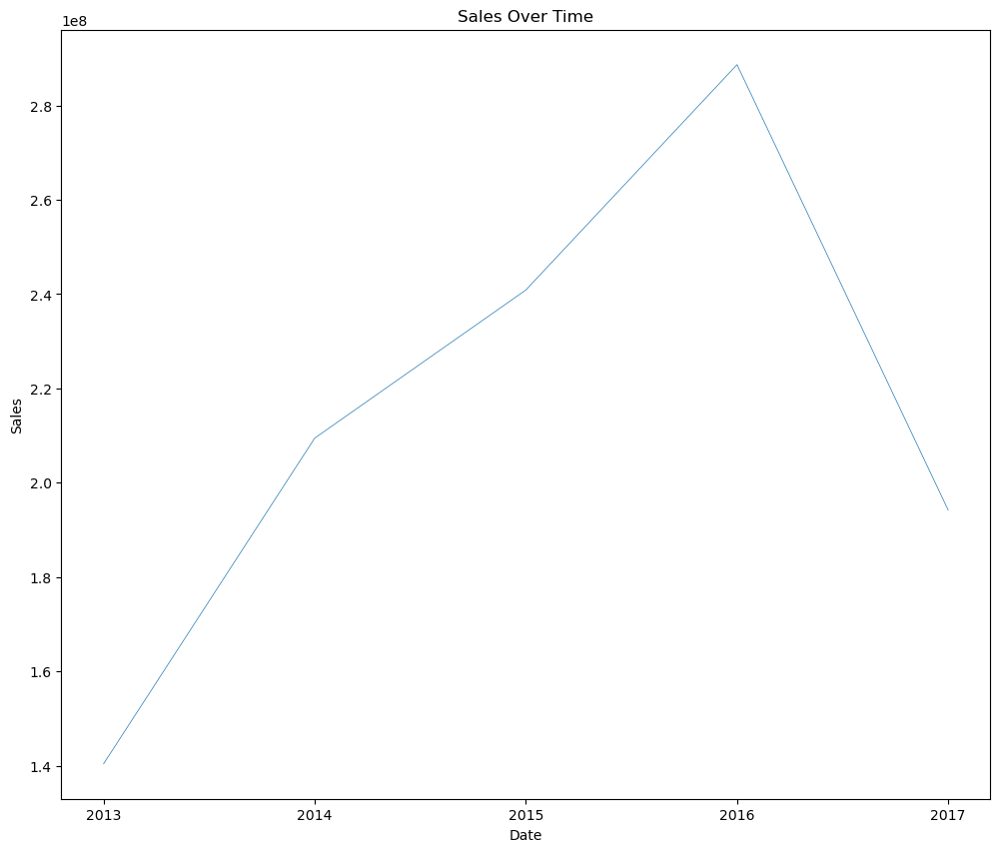

In [59]:
# want to visualize data for year
plt.figure(figsize=(12, 10))
plt.plot(sales_data_by_year.index, sales_data_by_year['sales'], linewidth=0.5)
plt.xlabel('Date')
plt.ylabel('Sales')
plt.title('Sales Over Time')
plt.show()

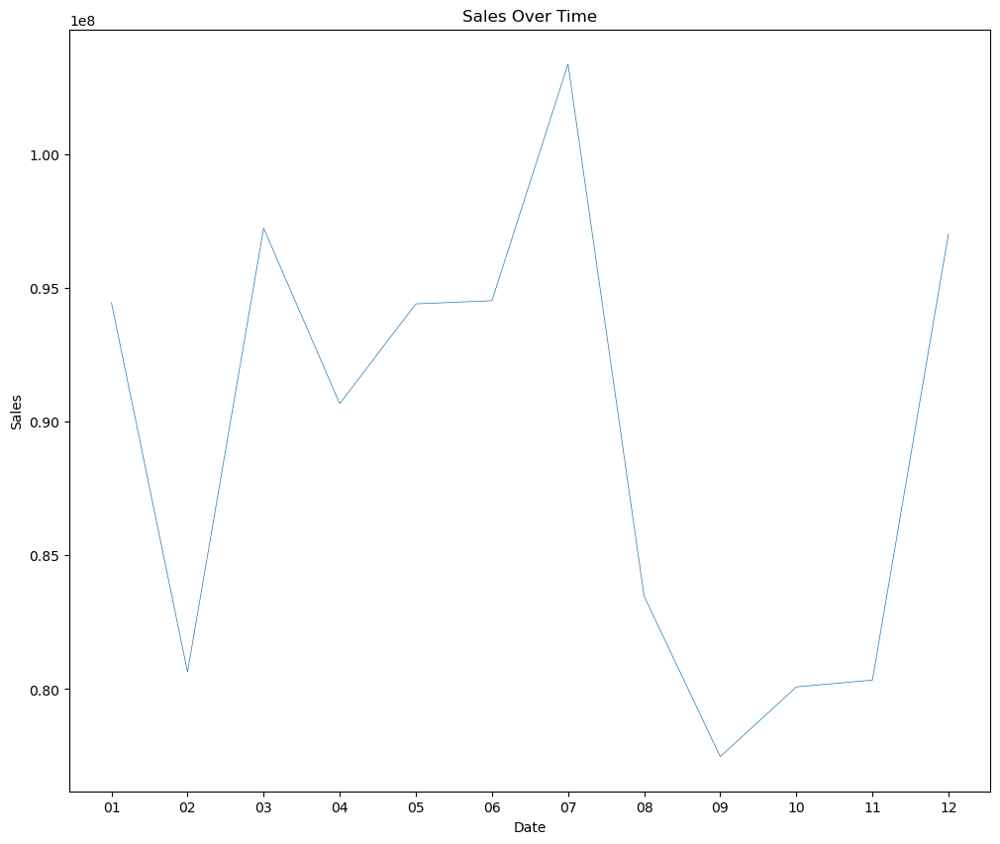

In [60]:
# want to visualize data for month
plt.figure(figsize=(12, 10))
plt.plot(sales_data_by_month.index, sales_data_by_month['sales'], linewidth=0.5)
plt.xlabel('Date')
plt.ylabel('Sales')
plt.title('Sales Over Time')
plt.show()



In [62]:
data_transaction['Year'] = data_transaction.index.year
data_transaction['Month'] = data_transaction.index.month_name()
data_transaction['Day'] = data_transaction.index.day_name()
data_transaction.head()

,store_nbr,transactions,Year,Month,Day
date,,,,,
2013-01-01,25,770,2013,January,Tuesday
2013-01-02,1,2111,2013,January,Wednesday
2013-01-02,2,2358,2013,January,Wednesday
2013-01-02,3,3487,2013,January,Wednesday
2013-01-02,4,1922,2013,January,Wednesday


In [64]:
import plotly.express as px

In [65]:
fig = px.line(data_transaction, y="transactions", title="Transaction data visuals over time")

fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)
fig.show()

## Univariate Analysis
Here is the section to explore, analyze, visualize each variable independently of the others.

In [ ]:
# Code here

## Bivariate & Multivariate Analysis
Here is the section to explore, analyze, visualize each variable in relation to the others.

In [ ]:
# Code here

# Feature Processing & Engineering
Here is the section to **clean**, **process** the dataset and **create new features**.

## Drop Duplicates

In [ ]:
# Use pandas.DataFrame.drop_duplicates method

## Dataset Splitting

In [ ]:
# Use train_test_split with a random_state, and add stratify for Classification

## Impute Missing Values

In [ ]:
# Use sklearn.impute.SimpleImputer

## New Features Creation

In [ ]:
# Code here

## Features Encoding




In [ ]:
# From sklearn.preprocessing use OneHotEncoder to encode the categorical features.

## Features Scaling


In [ ]:
# From sklearn.preprocessing use StandardScaler, MinMaxScaler, etc.

## Optional: Train set Balancing (for Classification only)

In [ ]:
# Use Over-sampling/Under-sampling methods, more details here: https://imbalanced-learn.org/stable/install.html

# Machine Learning Modeling 
Here is the section to **build**, **train**, **evaluate** and **compare** the models to each others.

## Simple Model #001

Please, keep the following structure to try all the model you want.

### Create the Model

In [ ]:
# Code here

### Train the Model

In [ ]:
# Use the .fit method

### Evaluate the Model on the Evaluation dataset (Evalset)

In [ ]:
# Compute the valid metrics for the use case # Optional: show the classification report 

### Predict on a unknown dataset (Testset)

In [ ]:
# Use .predict method # .predict_proba is available just for classification

## Simple Model #002

### Create the Model

In [ ]:
# Code here

### Train the Model

In [ ]:
# Use the .fit method

### Evaluate the Model on the Evaluation dataset (Evalset)

In [ ]:
# Compute the valid metrics for the use case # Optional: show the classification report 

### Predict on a unknown dataset (Testset)

In [ ]:
# Use .predict method # .predict_proba is available just for classification

## Models comparison
Create a pandas dataframe that will allow you to compare your models.

Find a sample frame below :

|     | Model_Name     | Metric (metric_name)    | Details  |
|:---:|:--------------:|:--------------:|:-----------------:|
| 0   |  -             |  -             | -                 |
| 1   |  -             |  -             | -                 |


You might use the pandas dataframe method `.sort_values()` to sort the dataframe regarding the metric.

## Hyperparameters tuning 

Fine-tune the Top-k models (3 < k < 5) using a ` GridSearchCV`  (that is in sklearn.model_selection
) to find the best hyperparameters and achieve the maximum performance of each of the Top-k models, then compare them again to select the best one.

In [ ]:
# Code here

# Export key components
Here is the section to **export** the important ML objects that will be use to develop an app: *Encoder, Scaler, ColumnTransformer, Model, Pipeline, etc*.

In [ ]:
# Use pickle : put all your key components in a python dictionary and save it as a file that will be loaded in an app